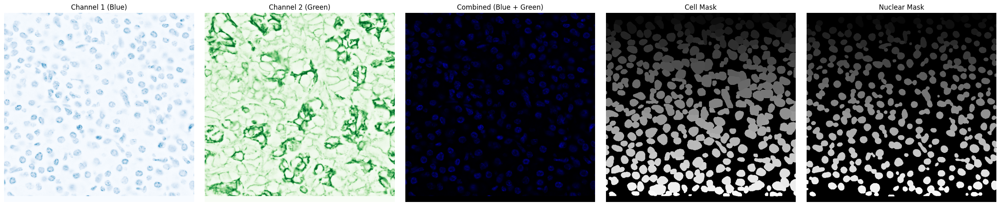

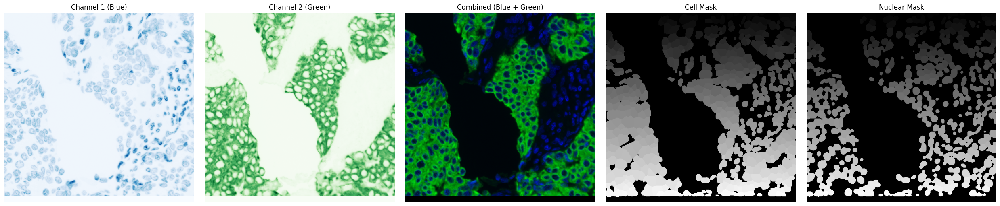

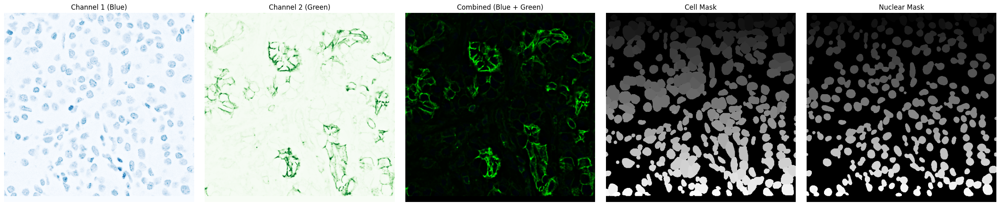

Number of images in the training set: 2580
Image dimensions: (512, 512)
Number of channels: 2
Number of annotation classes: 2

Analysis for sample 741:
Unique values in cell mask: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196]
Unique values in nuc

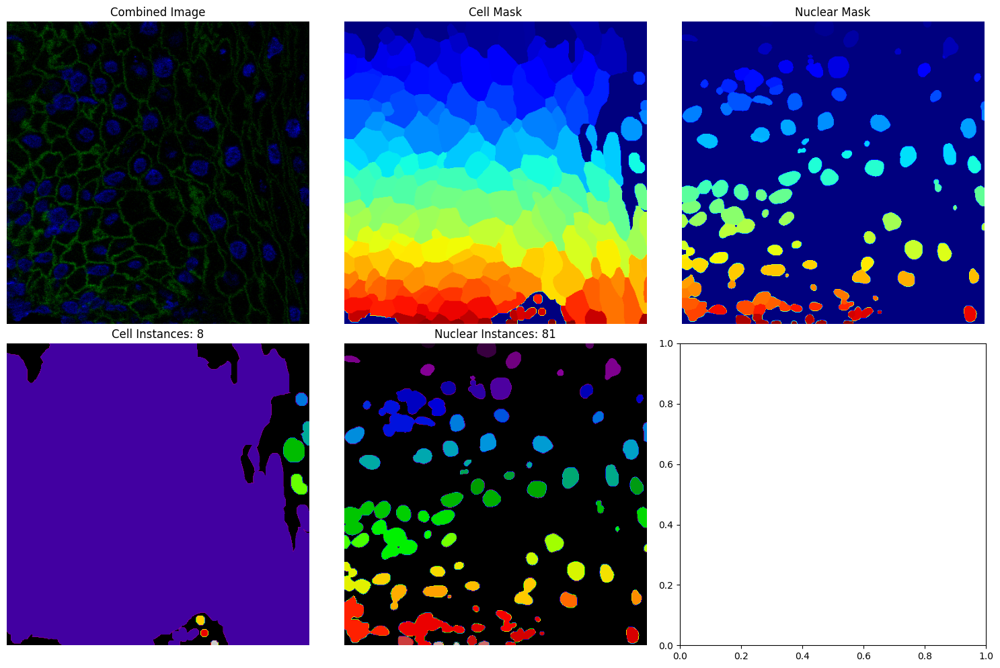


Analysis for sample 1248:
Unique values in cell mask: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 

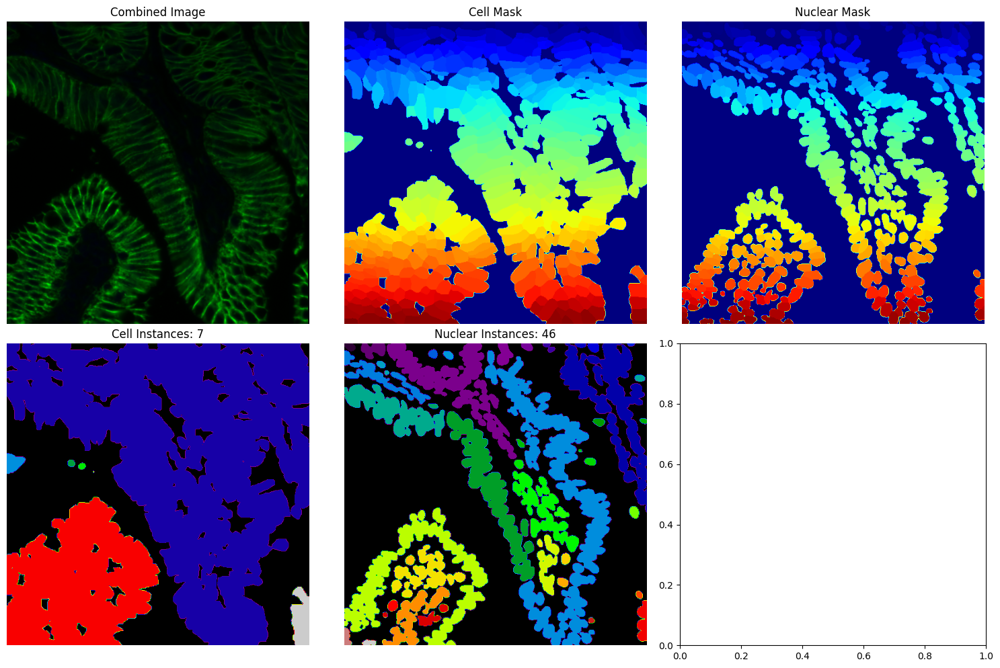


Analysis for sample 2143:
Unique values in cell mask: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 

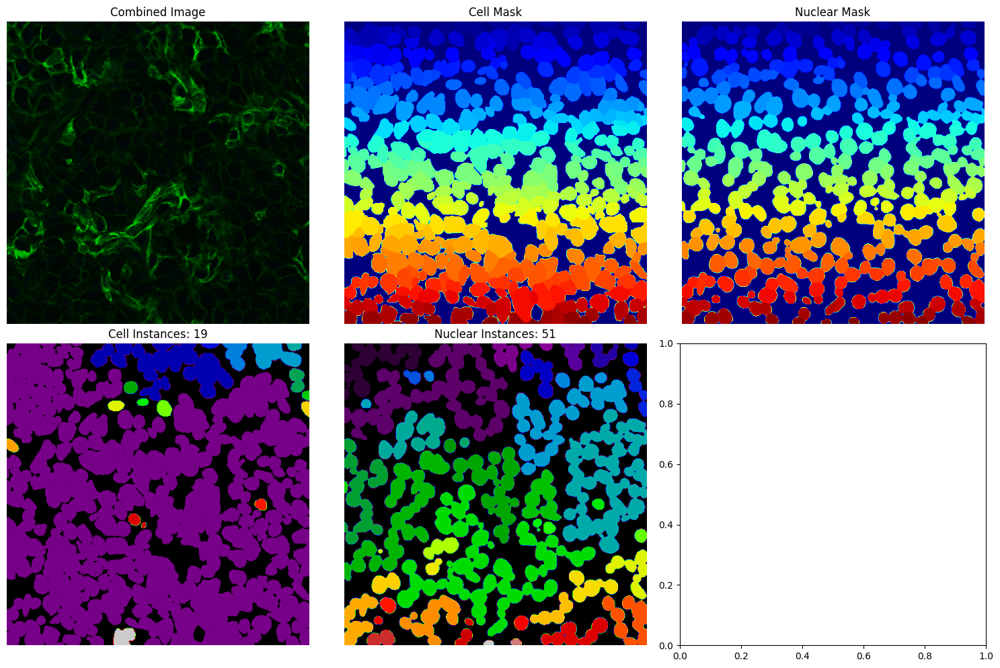


Dataset Information:
Number of images in the training set: 2580
Image dimensions: (512, 512)
Number of channels: 2
Number of annotation classes: 2


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Set the path to your data directory
data_dir = '/rsrch5/home/plm/yshokrollahi/project4/models/mesmer/tissuenet_v1.1/'

# Load the train.npz file
train_dict = np.load(os.path.join(data_dir, 'train.npz'))

# Get the image data from the npz
X, y = train_dict['X'], train_dict['y']

# Function to display a random sample
def display_random_sample(X, y, n_samples=1):
    for _ in range(n_samples):
        # Randomly choose an image to display
        plot_idx = np.random.randint(0, X.shape[0])
        
        # Create a figure with 5 subplots
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))
        
        # Display original image channels
        axes[0].imshow(X[plot_idx, ..., 0], cmap='Blues')
        axes[0].set_title('Channel 1 (Blue)')
        axes[0].axis('off')
        
        axes[1].imshow(X[plot_idx, ..., 1], cmap='Greens')
        axes[1].set_title('Channel 2 (Green)')
        axes[1].axis('off')
        
        # Display combined original image (channel 1 as blue, channel 2 as green)
        combined = np.zeros((*X[plot_idx].shape[:2], 3))
        combined[..., 2] = X[plot_idx, ..., 0]  # Blue channel
        combined[..., 1] = X[plot_idx, ..., 1]  # Green channel
        
        # Normalize the combined image
        combined = (combined - combined.min()) / (combined.max() - combined.min())
        
        axes[2].imshow(combined)
        axes[2].set_title('Combined (Blue + Green)')
        axes[2].axis('off')
        
        # Display cell mask
        axes[3].imshow(y[plot_idx, ..., 0], cmap='gray')
        axes[3].set_title('Cell Mask')
        axes[3].axis('off')
        
        # Display nuclear mask
        axes[4].imshow(y[plot_idx, ..., 1], cmap='gray')
        axes[4].set_title('Nuclear Mask')
        axes[4].axis('off')
        
        plt.tight_layout()
        plt.show()

# Display 3 random samples
display_random_sample(X, y, n_samples=3)

# Print some information about the dataset
print(f"Number of images in the training set: {X.shape[0]}")
print(f"Image dimensions: {X.shape[1:3]}")
print(f"Number of channels: {X.shape[3]}")
print(f"Number of annotation classes: {y.shape[3]}")

import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

# Your existing code for loading the dataset...

def analyze_and_display_sample(X, y, n_samples=1):
    for _ in range(n_samples):
        plot_idx = np.random.randint(0, X.shape[0])
        
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # Display combined original image
        combined = np.zeros((*X[plot_idx].shape[:2], 3))
        combined[..., 2] = X[plot_idx, ..., 0]  # Blue channel
        combined[..., 1] = X[plot_idx, ..., 1]  # Green channel
        combined = (combined - combined.min()) / (combined.max() - combined.min())
        
        axes[0, 0].imshow(combined)
        axes[0, 0].set_title('Combined Image')
        axes[0, 0].axis('off')
        
        # Display and analyze cell mask
        cell_mask = y[plot_idx, ..., 0]
        axes[0, 1].imshow(cell_mask, cmap='jet')
        axes[0, 1].set_title('Cell Mask')
        axes[0, 1].axis('off')
        
        # Display and analyze nuclear mask
        nuclear_mask = y[plot_idx, ..., 1]
        axes[0, 2].imshow(nuclear_mask, cmap='jet')
        axes[0, 2].set_title('Nuclear Mask')
        axes[0, 2].axis('off')
        
        # Analyze cell mask
        cell_labels, cell_num = ndi.label(cell_mask)
        axes[1, 0].imshow(cell_labels, cmap='nipy_spectral')
        axes[1, 0].set_title(f'Cell Instances: {cell_num}')
        axes[1, 0].axis('off')
        
        # Analyze nuclear mask
        nuclear_labels, nuclear_num = ndi.label(nuclear_mask)
        axes[1, 1].imshow(nuclear_labels, cmap='nipy_spectral')
        axes[1, 1].set_title(f'Nuclear Instances: {nuclear_num}')
        axes[1, 1].axis('off')
        
        # Print analysis
        print(f"\nAnalysis for sample {plot_idx}:")
        print(f"Unique values in cell mask: {np.unique(cell_mask)}")
        print(f"Unique values in nuclear mask: {np.unique(nuclear_mask)}")
        print(f"Number of cell instances: {cell_num}")
        print(f"Number of nuclear instances: {nuclear_num}")
        
        plt.tight_layout()
        plt.show()

# Analyze and display 3 random samples
analyze_and_display_sample(X, y, n_samples=3)

# Print dataset information
print(f"\nDataset Information:")
print(f"Number of images in the training set: {X.shape[0]}")
print(f"Image dimensions: {X.shape[1:3]}")
print(f"Number of channels: {X.shape[3]}")
print(f"Number of annotation classes: {y.shape[3]}")

In [2]:
import numpy as np
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import vit_b_16, ViT_B_16_Weights
from tqdm import tqdm

# Data Loading and Preprocessing
def load_tissuenet_data(base_path):
    datasets = ['train', 'val', 'test']
    data = {}
    
    for dataset in datasets:
        file_path = os.path.join(base_path, f'{dataset}.npz')
        loaded_data = np.load(file_path)
        data[dataset] = {
            'images': loaded_data['X'],
            'masks': loaded_data['y']
        }
    
    return data

base_path = '/rsrch5/home/plm/yshokrollahi/project4/models/mesmer/tissuenet_v1.1/'
tissuenet_data = load_tissuenet_data(base_path)

def create_256_crops(images, masks, crop_size=256, samples_per_image=4):
    crops_images, crops_masks = [], []
    
    for img, mask in zip(images, masks):
        h, w = img.shape[:2]
        if h == w == crop_size:
            # If the image is already 256x256, use it as is
            crops_images.append(img)
            crops_masks.append(mask)
        else:
            for _ in range(samples_per_image):
                top = np.random.randint(0, h - crop_size + 1)
                left = np.random.randint(0, w - crop_size + 1)
                
                img_crop = img[top:top+crop_size, left:left+crop_size]
                mask_crop = mask[top:top+crop_size, left:left+crop_size]
                
                crops_images.append(img_crop)
                crops_masks.append(mask_crop)
    
    return np.array(crops_images), np.array(crops_masks)

# Create crops for train and validation sets
train_crops_images, train_crops_masks = create_256_crops(tissuenet_data['train']['images'], tissuenet_data['train']['masks'])
val_crops_images, val_crops_masks = create_256_crops(tissuenet_data['val']['images'], tissuenet_data['val']['masks'])

# For test set, we'll create non-overlapping crops
def create_test_crops(images, masks, crop_size=256):
    crops_images, crops_masks = [], []
    
    for img, mask in zip(images, masks):
        h, w = img.shape[:2]
        if h == w == crop_size:
            # If the image is already 256x256, use it as is
            crops_images.append(img)
            crops_masks.append(mask)
        else:
            for top in range(0, h - crop_size + 1, crop_size):
                for left in range(0, w - crop_size + 1, crop_size):
                    img_crop = img[top:top+crop_size, left:left+crop_size]
                    mask_crop = mask[top:top+crop_size, left:left+crop_size]
                    
                    crops_images.append(img_crop)
                    crops_masks.append(mask_crop)
    
    return np.array(crops_images), np.array(crops_masks)

test_crops_images, test_crops_masks = create_test_crops(tissuenet_data['test']['images'], tissuenet_data['test']['masks'])

# Create a dictionary similar to your original data_splits
data_splits = [{
    'train': {
        'images': train_crops_images,
        'masks': train_crops_masks,
    },
    'val': {
        'images': val_crops_images,
        'masks': val_crops_masks,
    },
    'test': {
        'images': test_crops_images,
        'masks': test_crops_masks,
    }
}]

print("Data loading and preprocessing complete.")
print(f"Train set size: {len(train_crops_images)}")
print(f"Validation set size: {len(val_crops_images)}")
print(f"Test set size: {len(test_crops_images)}")
print(f"Train image shape: {train_crops_images[0].shape}")
print(f"Validation image shape: {val_crops_images[0].shape}")
print(f"Test image shape: {test_crops_images[0].shape}")
print(f"Mask shape: {train_crops_masks[0].shape}")

/usr/local/lib/python3.11/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Data loading and preprocessing complete.
Train set size: 10320
Validation set size: 3118
Test set size: 1324
Train image shape: (256, 256, 2)
Validation image shape: (256, 256, 2)
Test image shape: (256, 256, 2)
Mask shape: (256, 256, 2)


In [32]:
import torch
import numpy as np
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.transforms import functional as TF
from scipy.ndimage import gaussian_filter
import cv2
from skimage.segmentation import slic
from scipy.ndimage import map_coordinates
class TissueNetDataset(Dataset):
    def __init__(self, images, masks, image_transform=None, mask_transform=None, hv_transform=None, augment=False):
        self.images = images
        self.masks = masks
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.hv_transform = hv_transform
        self.augment = augment

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        # Normalize image to 0-1 range and convert to float32
        image_min, image_max = image.min(), image.max()
        image = ((image - image_min) / (image_max - image_min + 1e-8)).astype(np.float32)

        # Extract cell and nuclei masks
        cell_mask = mask[..., 0].astype(np.float32)
        nuclei_mask = mask[..., 1].astype(np.float32)


        
        # Generate HV maps
        cell_hv_map = self.generate_hv_map(cell_mask)
        nuclei_hv_map = self.generate_hv_map(nuclei_mask)
        
        
        # # Normalize masks to 0-1 range
        cell_mask = np.clip(cell_mask, 0, 1).astype(np.float32)
        nuclei_mask = np.clip(nuclei_mask, 0, 1).astype(np.float32)

        if self.augment:
            image, cell_mask, nuclei_mask, cell_hv_map, nuclei_hv_map = self.apply_augmentation(
                image, cell_mask, nuclei_mask, cell_hv_map, nuclei_hv_map)

        if self.image_transform:
            image = self.image_transform(image)

        if self.mask_transform:
            cell_mask = self.mask_transform(cell_mask)
            nuclei_mask = self.mask_transform(nuclei_mask)

        if self.hv_transform:
            cell_hv_map = self.hv_transform(cell_hv_map)
            nuclei_hv_map = self.hv_transform(nuclei_hv_map)
        else:
            cell_hv_map = torch.from_numpy(cell_hv_map).permute(2, 0, 1)
            nuclei_hv_map = torch.from_numpy(nuclei_hv_map).permute(2, 0, 1)

        return image, cell_mask, nuclei_mask, cell_hv_map, nuclei_hv_map

    def generate_hv_map(self, instance_mask):
        h_map = np.zeros_like(instance_mask, dtype=np.float32)
        v_map = np.zeros_like(instance_mask, dtype=np.float32)

        for instance_id in np.unique(instance_mask):
            if instance_id == 0:  # Skip background
                continue

            instance_pixels = np.where(instance_mask == instance_id)
            y_coords, x_coords = instance_pixels
            center_y, center_x = np.mean(y_coords), np.mean(x_coords)

            # Calculate the bounding box
            min_y, max_y = np.min(y_coords), np.max(y_coords)
            min_x, max_x = np.min(x_coords), np.max(x_coords)
            height = max_y - min_y + 1
            width = max_x - min_x + 1

            # Normalize by the maximum dimension for better scale invariance
            norm_factor = max(height, width)

            h_map[instance_pixels] = (x_coords - center_x) / norm_factor
            v_map[instance_pixels] = (y_coords - center_y) / norm_factor

        hv_map = np.stack([h_map, v_map], axis=-1)
        return hv_map



    def apply_augmentation(self, image, cell_mask, nuclei_mask, cell_hv_map, nuclei_hv_map):
        # Convert numpy arrays to tensors
        image = torch.from_numpy(image).permute(2, 0, 1)
        cell_mask = torch.from_numpy(cell_mask).unsqueeze(0)
        nuclei_mask = torch.from_numpy(nuclei_mask).unsqueeze(0)
        cell_hv_map = torch.from_numpy(cell_hv_map).permute(2, 0, 1)
        nuclei_hv_map = torch.from_numpy(nuclei_hv_map).permute(2, 0, 1)

        original_size = image.shape[1:]

        # Random 90-degree rotation
        if torch.rand(1) < 0.5:
            k = torch.randint(1, 4, (1,)).item()
            image = torch.rot90(image, k, [1, 2])
            cell_mask = torch.rot90(cell_mask, k, [1, 2])
            nuclei_mask = torch.rot90(nuclei_mask, k, [1, 2])
            cell_hv_map = torch.rot90(cell_hv_map, k, [1, 2])
            nuclei_hv_map = torch.rot90(nuclei_hv_map, k, [1, 2])

        # Random horizontal flip
        if torch.rand(1) < 0.5:
            image = TF.hflip(image)
            cell_mask = TF.hflip(cell_mask)
            nuclei_mask = TF.hflip(nuclei_mask)
            cell_hv_map = TF.hflip(cell_hv_map)
            nuclei_hv_map = TF.hflip(nuclei_hv_map)
            cell_hv_map[0] = -cell_hv_map[0]  # Flip horizontal map
            nuclei_hv_map[0] = -nuclei_hv_map[0]  # Flip horizontal map

        # Random vertical flip
        if torch.rand(1) < 0.5:
            image = TF.vflip(image)
            cell_mask = TF.vflip(cell_mask)
            nuclei_mask = TF.vflip(nuclei_mask)
            cell_hv_map = TF.vflip(cell_hv_map)
            nuclei_hv_map = TF.vflip(nuclei_hv_map)
            cell_hv_map[1] = -cell_hv_map[1]  # Flip vertical map
            nuclei_hv_map[1] = -nuclei_hv_map[1]  # Flip vertical map

        # Random scaling (downscaling)
        if torch.rand(1) < 0.5:
            scale_factor = torch.FloatTensor(1).uniform_(0.8, 1.0).item()
            new_size = [max(224, int(s * scale_factor)) for s in image.shape[1:]]
            image = TF.resize(image, new_size)
            cell_mask = TF.resize(cell_mask, new_size)
            nuclei_mask = TF.resize(nuclei_mask, new_size)
            cell_hv_map = TF.resize(cell_hv_map, new_size)
            nuclei_hv_map = TF.resize(nuclei_hv_map, new_size)

        # Elastic transformation
        if torch.rand(1) < 0.5:
            image = self.elastic_transform(image.permute(1, 2, 0).numpy())
            cell_mask = self.elastic_transform(cell_mask.squeeze().numpy(), is_mask=True)
            nuclei_mask = self.elastic_transform(nuclei_mask.squeeze().numpy(), is_mask=True)
            cell_hv_map = self.elastic_transform(cell_hv_map.permute(1, 2, 0).numpy())
            nuclei_hv_map = self.elastic_transform(nuclei_hv_map.permute(1, 2, 0).numpy())
            
            image = torch.from_numpy(image).permute(2, 0, 1)
            cell_mask = torch.from_numpy(cell_mask).unsqueeze(0)
            nuclei_mask = torch.from_numpy(nuclei_mask).unsqueeze(0)
            cell_hv_map = torch.from_numpy(cell_hv_map).permute(2, 0, 1)
            nuclei_hv_map = torch.from_numpy(nuclei_hv_map).permute(2, 0, 1)

        # Ensure image is large enough for subsequent operations
        if min(image.shape[1:]) < 224:
            scale_factor = 224 / min(image.shape[1:])
            new_size = [int(s * scale_factor) for s in image.shape[1:]]
            image = TF.resize(image, new_size)
            cell_mask = TF.resize(cell_mask, new_size)
            nuclei_mask = TF.resize(nuclei_mask, new_size)
            cell_hv_map = TF.resize(cell_hv_map, new_size)
            nuclei_hv_map = TF.resize(nuclei_hv_map, new_size)

        # Blurring
        if torch.rand(1) < 0.5:
            sigma = torch.FloatTensor(1).uniform_(0.1, 2.0).item()
            image = torch.from_numpy(gaussian_filter(image.numpy(), sigma=(0, sigma, sigma)))

        # Gaussian noise
        if torch.rand(1) < 0.5:
            noise = torch.randn_like(image) * 0.1
            image = image + noise
            image = torch.clamp(image, 0, 1)

        # Color jittering
        # Color jittering only for 3-channel images
        if image.shape[0] == 3 and torch.rand(1) < 0.5:
            brightness_factor = torch.tensor(1.0).uniform_(0.8, 1.2).item()
            contrast_factor = torch.tensor(1.0).uniform_(0.8, 1.2).item()
            saturation_factor = torch.tensor(1.0).uniform_(0.8, 1.2).item()
            hue_factor = torch.tensor(1.0).uniform_(-0.1, 0.1).item()
            image = TF.adjust_brightness(image, brightness_factor)
            image = TF.adjust_contrast(image, contrast_factor)
            image = TF.adjust_saturation(image, saturation_factor)
            image = TF.adjust_hue(image, hue_factor)

        # SLIC superpixels
        if torch.rand(1) < 0.5:
            image = self.apply_slic(image)

        # Zoom blur
        if torch.rand(1) < 0.5:
            image = self.zoom_blur(image)

        # Random cropping with resizing
        if torch.rand(1) < 0.5:
            i, j, h, w = transforms.RandomCrop.get_params(image, output_size=(224, 224))
            image = TF.crop(image, i, j, h, w)
            cell_mask = TF.crop(cell_mask, i, j, h, w)
            nuclei_mask = TF.crop(nuclei_mask, i, j, h, w)
            cell_hv_map = TF.crop(cell_hv_map, i, j, h, w)
            nuclei_hv_map = TF.crop(nuclei_hv_map, i, j, h, w)

        # Resize back to original size
        image = TF.resize(image, original_size)
        cell_mask = TF.resize(cell_mask, original_size)
        nuclei_mask = TF.resize(nuclei_mask, original_size)
        cell_hv_map = TF.resize(cell_hv_map, original_size)
        nuclei_hv_map = TF.resize(nuclei_hv_map, original_size)

        return image, cell_mask, nuclei_mask, cell_hv_map, nuclei_hv_map

    def elastic_transform(self, image, alpha=1, sigma=0.1, alpha_affine=0.1, is_mask=False):
        """Elastic deformation of images as described in [Simard2003]_."""
        random_state = np.random.RandomState(None)

        if image.ndim == 2:
            shape = image.shape
        elif image.ndim == 3:
            shape = image.shape[:2]
        else:
            raise ValueError("Image must be 2D or 3D")

        # Random affine
        center_square = np.float32(shape) // 2
        square_size = min(shape) // 3
        pts1 = np.float32([center_square + square_size, [center_square[0]+square_size, center_square[1]-square_size], center_square - square_size])
        pts2 = pts1 + random_state.uniform(-alpha_affine, alpha_affine, size=pts1.shape).astype(np.float32)
        M = cv2.getAffineTransform(pts1, pts2)

        if is_mask:
            if image.ndim == 2:
                image = cv2.warpAffine(image, M, shape[::-1], borderMode=cv2.BORDER_CONSTANT, flags=cv2.INTER_NEAREST)
            else:
                image = np.stack([cv2.warpAffine(image[:,:,i], M, shape[::-1], borderMode=cv2.BORDER_CONSTANT, flags=cv2.INTER_NEAREST) for i in range(image.shape[2])], axis=2)
        else:
            if image.ndim == 2:
                image = cv2.warpAffine(image, M, shape[::-1], borderMode=cv2.BORDER_REFLECT_101)
            else:
                image = np.stack([cv2.warpAffine(image[:,:,i], M, shape[::-1], borderMode=cv2.BORDER_REFLECT_101) for i in range(image.shape[2])], axis=2)

        dx = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma) * alpha
        dy = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma) * alpha

        x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
        indices = np.reshape(y+dy, (-1, 1)), np.reshape(x+dx, (-1, 1))

        if is_mask:
            if image.ndim == 2:
                return map_coordinates(image, indices, order=0, mode='constant').reshape(shape)
            else:
                return np.stack([map_coordinates(image[:,:,i], indices, order=0, mode='constant').reshape(shape) for i in range(image.shape[2])], axis=2)
        else:
            if image.ndim == 2:
                return map_coordinates(image, indices, order=1, mode='reflect').reshape(shape)
            else:
                return np.stack([map_coordinates(image[:,:,i], indices, order=1, mode='reflect').reshape(shape) for i in range(image.shape[2])], axis=2)

    def apply_slic(self, image):
        image_np = image.numpy().transpose(1, 2, 0)
        segments = slic(image_np, n_segments=100, compactness=10, sigma=1)
        out = np.zeros_like(image_np)
        for i in np.unique(segments):
            mask = segments == i
            out[mask] = np.mean(image_np[mask], axis=0)
        return torch.from_numpy(out.transpose(2, 0, 1))

    def zoom_blur(self, image, max_factor=1.2):
        c, h, w = image.shape
        zoom_factor = torch.FloatTensor(1).uniform_(1, max_factor).item()
        zh = int(np.round(h * zoom_factor))
        zw = int(np.round(w * zoom_factor))
        zoom_image = TF.resize(image, (zh, zw))
        zoom_image = TF.center_crop(zoom_image, (h, w))
        return (image + zoom_image) / 2

# Define transforms
image_transform = transforms.Compose([
    transforms.Lambda(lambda x: x if isinstance(x, torch.Tensor) else torch.from_numpy(x).permute(2, 0, 1)),
    transforms.Lambda(lambda x: x.float()),
    transforms.Resize(256, antialias=True)
])

mask_transform = transforms.Compose([
    transforms.Lambda(lambda x: x if isinstance(x, torch.Tensor) else torch.from_numpy(x).unsqueeze(0)),
    transforms.Lambda(lambda x: x.float()),
    transforms.Resize(256, antialias=True)
])

hv_transform = transforms.Compose([
    transforms.Lambda(lambda x: x if isinstance(x, torch.Tensor) else torch.from_numpy(x).permute(2, 0, 1)),
    transforms.Lambda(lambda x: x.float()),
])

# Create datasets
train_dataset = TissueNetDataset(
    train_crops_images,
    train_crops_masks,
    image_transform=image_transform,
    mask_transform=mask_transform,
    hv_transform=hv_transform,
    augment=True
)

val_dataset = TissueNetDataset(
    val_crops_images,
    val_crops_masks,
    image_transform=image_transform,
    mask_transform=mask_transform,
    hv_transform=hv_transform,
    augment=False
)

test_dataset = TissueNetDataset(
    test_crops_images,
    test_crops_masks,
    image_transform=image_transform,
    mask_transform=mask_transform,
    hv_transform=hv_transform,
    augment=False
)


# Create DataLoaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Check first item in train_dataset
print("\nChecking first item in train_dataset:")
image, cell_mask, nuclei_mask, cell_hv_map, nuclei_hv_map = train_dataset[0]
print(f"Image shape: {image.shape}, dtype: {image.dtype}")
print(f"Cell mask shape: {cell_mask.shape}, dtype: {cell_mask.dtype}")
print(f"Nuclei mask shape: {nuclei_mask.shape}, dtype: {nuclei_mask.dtype}")
print(f"Cell HV map shape: {cell_hv_map.shape}, dtype: {cell_hv_map.dtype}")
print(f"Nuclei HV map shape: {nuclei_hv_map.shape}, dtype: {nuclei_hv_map.dtype}")
print(f"Image min: {image.min().item():.4f}, max: {image.max().item():.4f}")
print(f"Cell mask min: {cell_mask.min().item():.4f}, max: {cell_mask.max().item():.4f}")
# Print information about a few samples from each dataset
for dataset, name in [(train_dataset, "Training"), (val_dataset, "Validation"), (test_dataset, "Test")]:
    print(f"\n{name} dataset information:")
    for i in range(3):  # Check 3 samples
        print(f"\nSample {i}:")
        _ = dataset[i]  # This will trigger the __getitem__ method and print the debug information


Checking first item in train_dataset:
Image shape: torch.Size([2, 256, 256]), dtype: torch.float32
Cell mask shape: torch.Size([1, 256, 256]), dtype: torch.float32
Nuclei mask shape: torch.Size([1, 256, 256]), dtype: torch.float32
Cell HV map shape: torch.Size([2, 256, 256]), dtype: torch.float32
Nuclei HV map shape: torch.Size([2, 256, 256]), dtype: torch.float32
Image min: 0.0000, max: 0.6232
Cell mask min: 0.0000, max: 1.0000

Training dataset information:

Sample 0:

Sample 1:

Sample 2:

Validation dataset information:

Sample 0:

Sample 1:

Sample 2:

Test dataset information:

Sample 0:

Sample 1:

Sample 2:



Training sample 1 structure:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32

Training sample 2 structure:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32


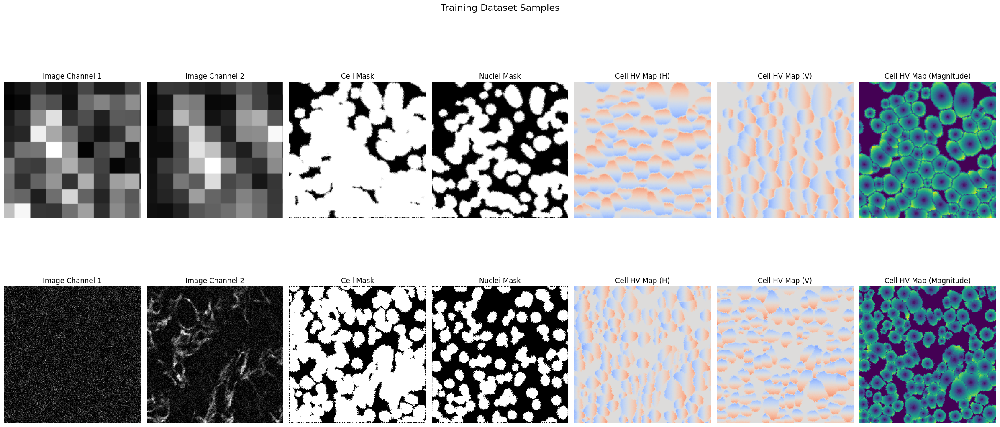


Validation sample 1 structure:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32

Validation sample 2 structure:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32


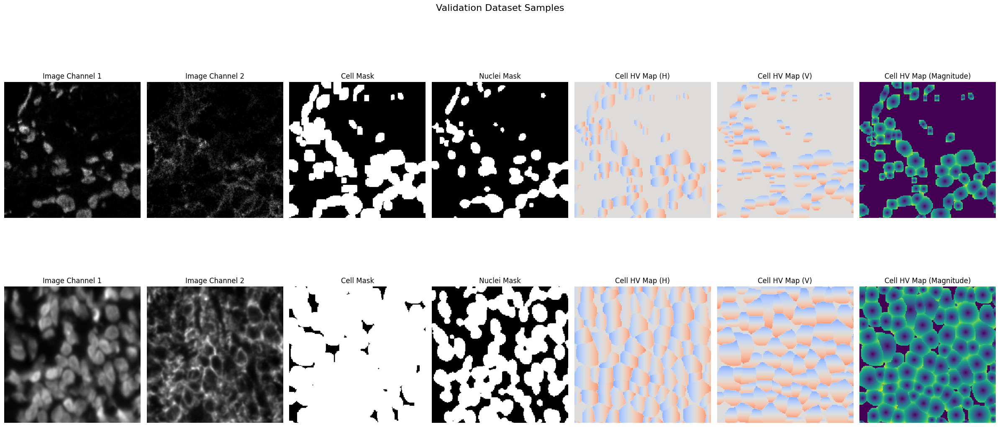


Test sample 1 structure:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32

Test sample 2 structure:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32


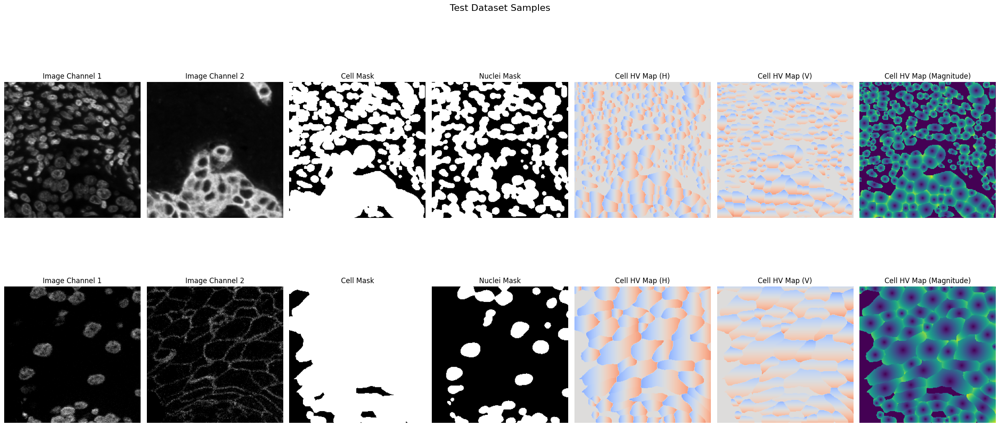


Training dataset size: 10320
Validation dataset size: 3118
Test dataset size: 1324

Training dataset sample information:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32

Validation dataset sample information:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 4: shape torch.Size([2, 256, 256]), dtype torch.float32

Test dataset sample information:
Item 0: shape torch.Size([2, 256, 256]), dtype torch.float32
Item 1: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 2: shape torch.Size([1, 256, 256]), dtype torch.float32
Item 3: sha

In [33]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def visualize_samples(dataset, num_samples=2, dataset_name=""):
    fig, axes = plt.subplots(num_samples, 7, figsize=(24, 6*num_samples))
    fig.suptitle(f"{dataset_name} Dataset Samples", fontsize=16)

    for i in range(num_samples):
        try:
            sample = dataset[np.random.randint(len(dataset))]
            print(f"\n{dataset_name} sample {i+1} structure:")
            for j, item in enumerate(sample):
                print(f"Item {j}: shape {item.shape}, dtype {item.dtype}")

            image, cell_mask, nuclei_mask, cell_hv_map, nuclei_hv_map = sample
            
            # Convert tensors to numpy arrays
            image = image.numpy()
            cell_mask = cell_mask.squeeze().numpy()
            nuclei_mask = nuclei_mask.squeeze().numpy()
            cell_hv_map = cell_hv_map.numpy()
            nuclei_hv_map = nuclei_hv_map.numpy()

            axes[i, 0].imshow(image[0], cmap='gray')
            axes[i, 0].set_title("Image Channel 1")
            axes[i, 1].imshow(image[1], cmap='gray')
            axes[i, 1].set_title("Image Channel 2")
            axes[i, 2].imshow(cell_mask, cmap='gray')
            axes[i, 2].set_title("Cell Mask")
            axes[i, 3].imshow(nuclei_mask, cmap='gray')
            axes[i, 3].set_title("Nuclei Mask")
            
            if cell_hv_map.ndim == 3:
                axes[i, 4].imshow(cell_hv_map[0], cmap='coolwarm', vmin=-1, vmax=1)
                axes[i, 4].set_title("Cell HV Map (H)")
                axes[i, 5].imshow(cell_hv_map[1], cmap='coolwarm', vmin=-1, vmax=1)
                axes[i, 5].set_title("Cell HV Map (V)")
                axes[i, 6].imshow(np.sqrt(np.sum(cell_hv_map**2, axis=0)), cmap='viridis')
                axes[i, 6].set_title("Cell HV Map (Magnitude)")
            else:
                axes[i, 4].text(0.5, 0.5, f"HV Map shape: {cell_hv_map.shape}", ha='center', va='center')
                axes[i, 4].set_title("Cell HV Map (Invalid shape)")
                axes[i, 5].axis('off')
                axes[i, 6].axis('off')

            for ax in axes[i]:
                ax.axis('off')
        except Exception as e:
            print(f"Error processing {dataset_name} sample {i+1}: {str(e)}")
            for ax in axes[i]:
                ax.text(0.5, 0.5, "Error processing sample", ha='center', va='center')
                ax.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize samples from each dataset
visualize_samples(train_dataset, num_samples=2, dataset_name="Training")
visualize_samples(val_dataset, num_samples=2, dataset_name="Validation")
visualize_samples(test_dataset, num_samples=2, dataset_name="Test")

# Print dataset sizes
print(f"\nTraining dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

# Print detailed information for a sample from each dataset
for dataset, name in [(train_dataset, "Training"), (val_dataset, "Validation"), (test_dataset, "Test")]:
    print(f"\n{name} dataset sample information:")
    sample = dataset[0]
    for i, item in enumerate(sample):
        print(f"Item {i}: shape {item.shape}, dtype {item.dtype}")


Sample 1:
Images shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Cell masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Nuclear masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Cell HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Nuclear HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32

Statistics:
Images - min: 0.0000, max: 1.0000, mean: 0.1418
Cell masks - min: 0.0000, max: 1.0000, mean: 0.6202
Nuclear masks - min: 0.0000, max: 1.0000, mean: 0.4331
Cell HV maps - min: -0.6795, max: 0.8006, mean: 0.0000
Nuclear HV maps - min: -0.6370, max: 0.5832, mean: -0.0000


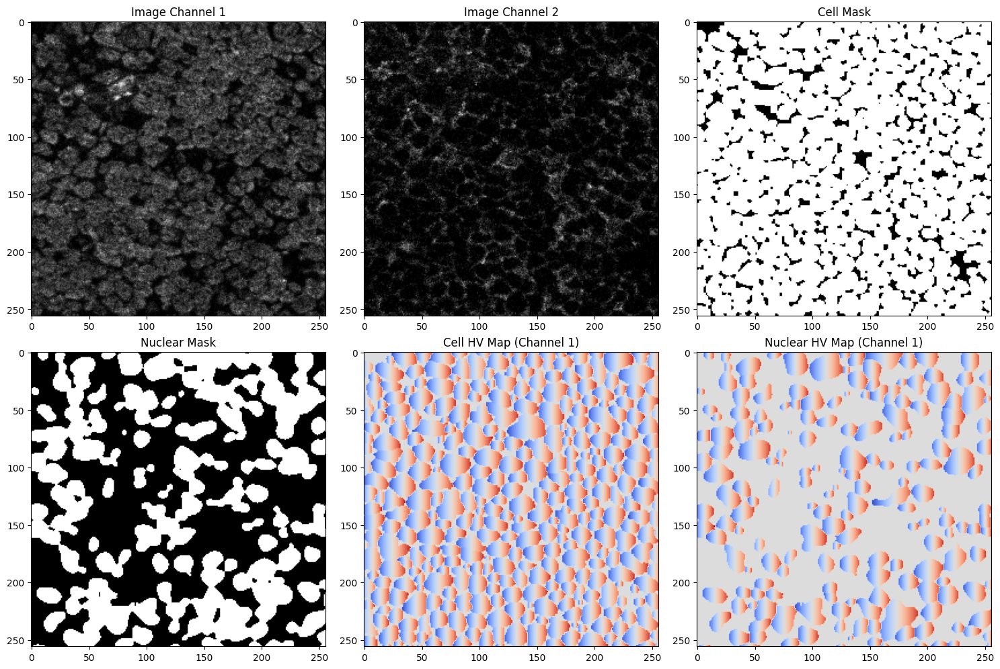


Sample 2:
Images shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Cell masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Nuclear masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Cell HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Nuclear HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32

Statistics:
Images - min: 0.0000, max: 1.0000, mean: 0.1925
Cell masks - min: 0.0000, max: 1.0000, mean: 0.7656
Nuclear masks - min: 0.0000, max: 1.0000, mean: 0.5156
Cell HV maps - min: -0.6818, max: 0.7126, mean: 0.0000
Nuclear HV maps - min: -0.6863, max: 0.6006, mean: -0.0000


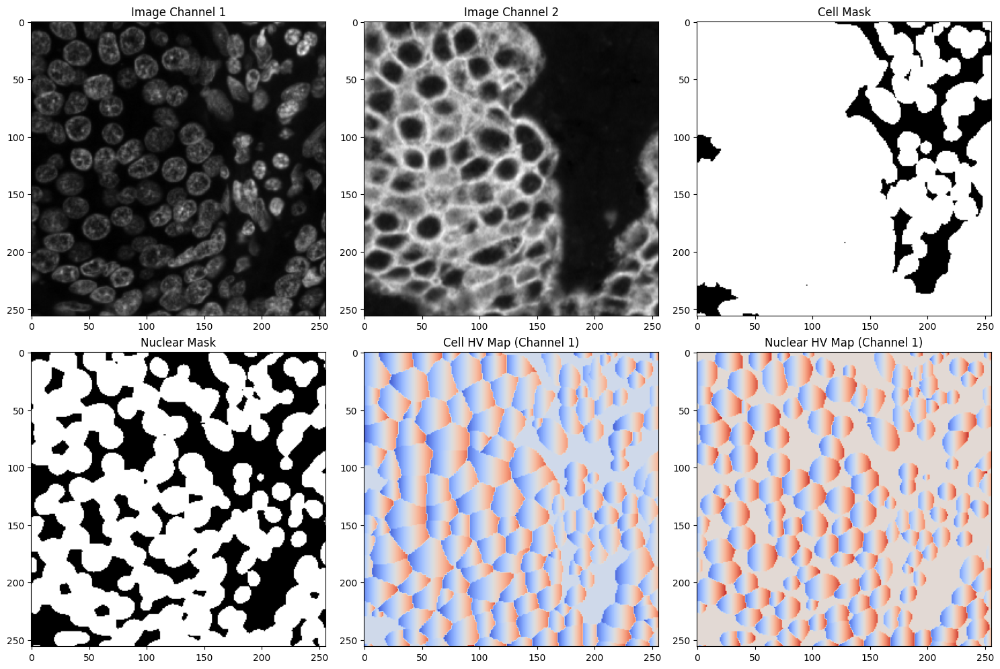


Sample 3:
Images shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Cell masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Nuclear masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Cell HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Nuclear HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32

Statistics:
Images - min: 0.0000, max: 1.0000, mean: 0.1398
Cell masks - min: 0.0000, max: 1.0000, mean: 0.5135
Nuclear masks - min: 0.0000, max: 1.0000, mean: 0.3588
Cell HV maps - min: -0.6607, max: 0.8377, mean: 0.0000
Nuclear HV maps - min: -0.6112, max: 0.6156, mean: 0.0000


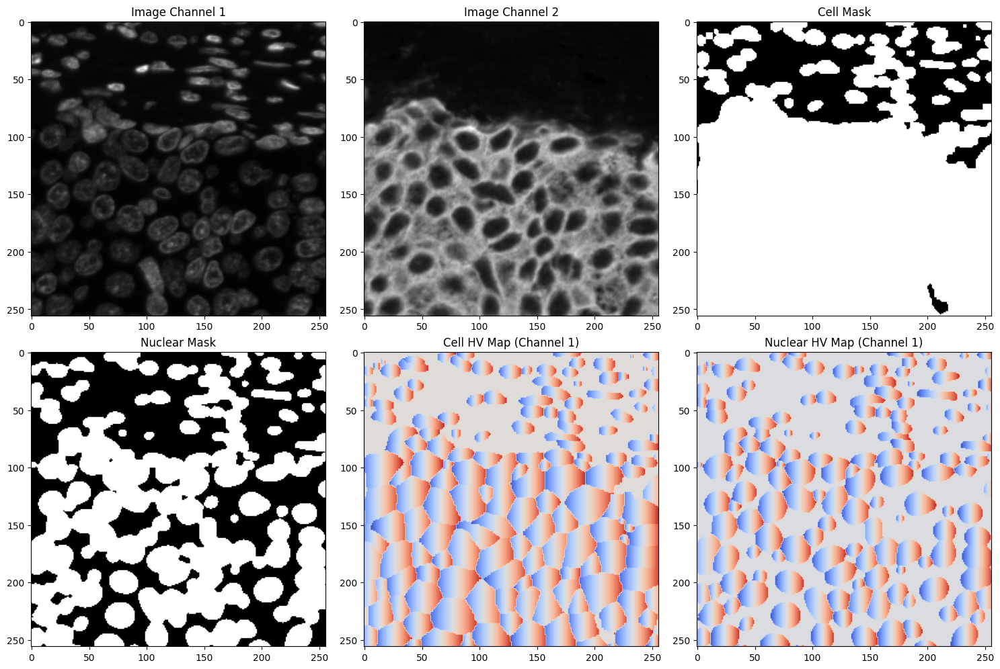


Sample 4:
Images shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Cell masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Nuclear masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Cell HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Nuclear HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32

Statistics:
Images - min: 0.0000, max: 1.0000, mean: 0.1533
Cell masks - min: 0.0000, max: 1.0000, mean: 0.6757
Nuclear masks - min: 0.0000, max: 1.0000, mean: 0.5066
Cell HV maps - min: -0.8709, max: 0.8307, mean: -0.0000
Nuclear HV maps - min: -0.5998, max: 0.8570, mean: 0.0000


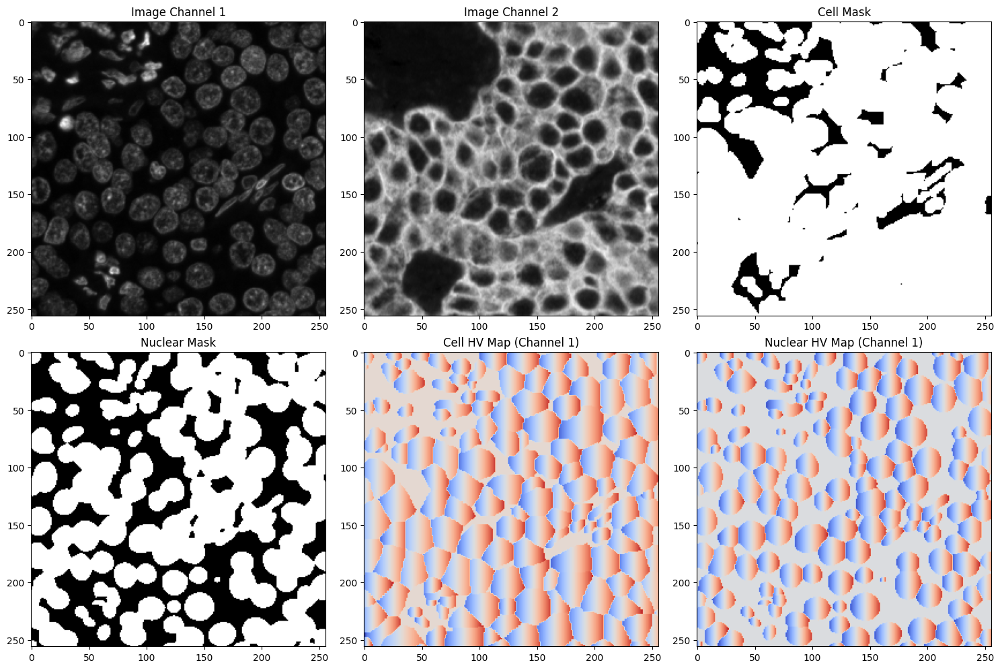


Sample 5:
Images shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Cell masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Nuclear masks shape: torch.Size([16, 1, 256, 256]), dtype: torch.float32
Cell HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32
Nuclear HV maps shape: torch.Size([16, 2, 256, 256]), dtype: torch.float32

Statistics:
Images - min: 0.0000, max: 1.0000, mean: 0.1564
Cell masks - min: 0.0000, max: 1.0000, mean: 0.4695
Nuclear masks - min: 0.0000, max: 1.0000, mean: 0.3233
Cell HV maps - min: -0.7521, max: 0.7114, mean: 0.0000
Nuclear HV maps - min: -0.6014, max: 0.5734, mean: 0.0000


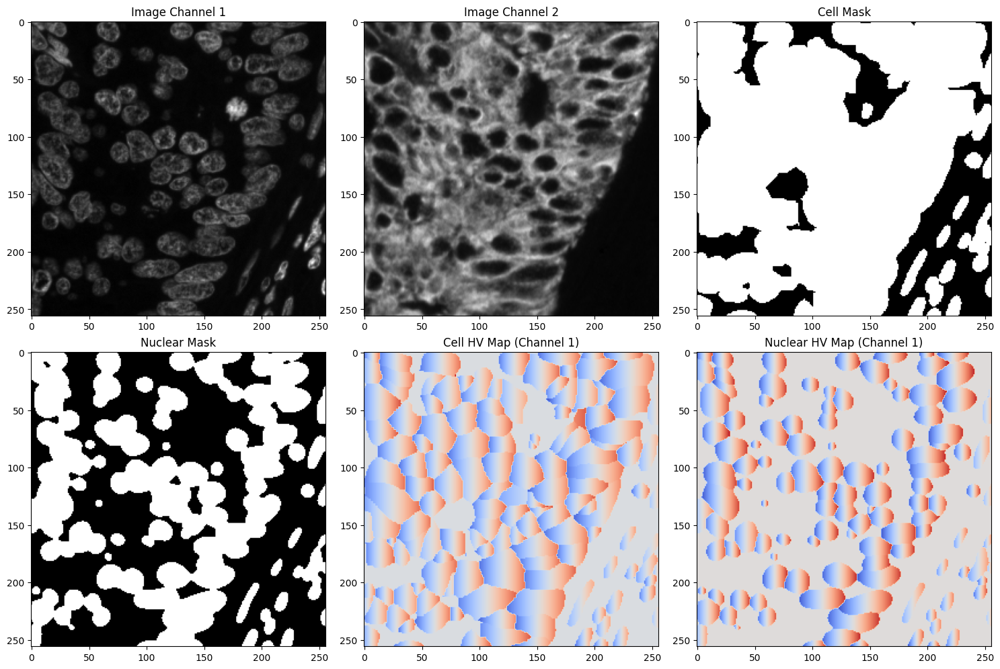

In [34]:
import torch
import numpy as np
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

def check_data(dataloader, num_samples=5):
    for i, (images, cell_masks, nuclear_masks, cell_hv_maps, nuclear_hv_maps) in enumerate(dataloader):
        if i >= num_samples:
            break
        
        print(f"\nSample {i+1}:")
        print(f"Images shape: {images.shape}, dtype: {images.dtype}")
        print(f"Cell masks shape: {cell_masks.shape}, dtype: {cell_masks.dtype}")
        print(f"Nuclear masks shape: {nuclear_masks.shape}, dtype: {nuclear_masks.dtype}")
        print(f"Cell HV maps shape: {cell_hv_maps.shape}, dtype: {cell_hv_maps.dtype}")
        print(f"Nuclear HV maps shape: {nuclear_hv_maps.shape}, dtype: {nuclear_hv_maps.dtype}")
        
        print("\nStatistics:")
        print(f"Images - min: {images.min():.4f}, max: {images.max():.4f}, mean: {images.mean():.4f}")
        print(f"Cell masks - min: {cell_masks.min():.4f}, max: {cell_masks.max():.4f}, mean: {cell_masks.mean():.4f}")
        print(f"Nuclear masks - min: {nuclear_masks.min():.4f}, max: {nuclear_masks.max():.4f}, mean: {nuclear_masks.mean():.4f}")
        print(f"Cell HV maps - min: {cell_hv_maps.min():.4f}, max: {cell_hv_maps.max():.4f}, mean: {cell_hv_maps.mean():.4f}")
        print(f"Nuclear HV maps - min: {nuclear_hv_maps.min():.4f}, max: {nuclear_hv_maps.max():.4f}, mean: {nuclear_hv_maps.mean():.4f}")
        
        # Check for NaN and Inf values
        for name, tensor in [("Images", images), ("Cell masks", cell_masks), ("Nuclear masks", nuclear_masks), 
                             ("Cell HV maps", cell_hv_maps), ("Nuclear HV maps", nuclear_hv_maps)]:
            if torch.isnan(tensor).any():
                print(f"WARNING: NaN values detected in {name}")
            if torch.isinf(tensor).any():
                print(f"WARNING: Inf values detected in {name}")
        
        # Visualize the first image and its corresponding masks/maps
        fig, axs = plt.subplots(2, 3, figsize=(15, 10))
        axs[0, 0].imshow(images[0, 0].numpy(), cmap='gray')
        axs[0, 0].set_title("Image Channel 1")
        axs[0, 1].imshow(images[0, 1].numpy(), cmap='gray')
        axs[0, 1].set_title("Image Channel 2")
        axs[0, 2].imshow(cell_masks[0, 0].numpy(), cmap='gray')
        axs[0, 2].set_title("Cell Mask")
        axs[1, 0].imshow(nuclear_masks[0, 0].numpy(), cmap='gray')
        axs[1, 0].set_title("Nuclear Mask")
        axs[1, 1].imshow(cell_hv_maps[0, 0].numpy(), cmap='coolwarm')
        axs[1, 1].set_title("Cell HV Map (Channel 1)")
        axs[1, 2].imshow(nuclear_hv_maps[0, 0].numpy(), cmap='coolwarm')
        axs[1, 2].set_title("Nuclear HV Map (Channel 1)")
        plt.tight_layout()
        plt.show()

# Assuming you have your train_loader defined
check_data(test_loader)

In [35]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import swin_t, Swin_T_Weights

class SEBlock(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.norm1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.norm2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.se = SEBlock(out_channels)

    def forward(self, x):
        x = self.relu(self.norm1(self.conv1(x)))
        x = self.relu(self.norm2(self.conv2(x)))
        x = self.se(x)
        return x

class SwinEncoder(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        if pretrained:
            weights = Swin_T_Weights.IMAGENET1K_V1
        else:
            weights = None
        self.swin = swin_t(weights=weights)
        self.swin.head = nn.Identity()  # Remove the classifier head
        
        # Modify the first convolutional layer to accept 2-channel input
        self.swin.features[0][0] = nn.Conv2d(2, 96, kernel_size=(4, 4), stride=(4, 4))

    def forward(self, x):
        features = []
        for i, layer in enumerate(self.swin.features):
            x = layer(x)
            if i in [2, 4, 6]:  # Collect features from specific layers
                features.append(x)
        return features

class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class MultiHeadDecoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.decoder1 = DecoderBlock(768, 384)
        self.decoder2 = DecoderBlock(384 + 384, 192)
        self.decoder3 = DecoderBlock(192 + 192, 96)
        self.decoder4 = DecoderBlock(96 + 192, 48)
        
        # Cell segmentation (all cells)
        self.cell_seg_conv = nn.Conv2d(48, 1, kernel_size=1)
        
        # Nuclear segmentation
        self.nuclear_seg_conv = nn.Conv2d(48, 1, kernel_size=1)
        
        # HV map for cells
        self.cell_hv_conv = nn.Conv2d(48, 2, kernel_size=1)
        
        # HV map for nuclei
        self.nuclei_hv_conv = nn.Conv2d(48, 2, kernel_size=1)
        
        self.attention1 = AttentionBlock(F_g=384, F_l=384, F_int=192)
        self.attention2 = AttentionBlock(F_g=192, F_l=192, F_int=96)
        self.attention3 = AttentionBlock(F_g=96, F_l=192, F_int=48)

    def forward(self, features):
        x = features[-1].permute(0, 3, 1, 2)  # Change from [B, H, W, C] to [B, C, H, W]
        x = self.decoder1(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        
        skip1 = features[-2].permute(0, 3, 1, 2)
        skip1 = F.interpolate(skip1, size=x.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, self.attention1(x, skip1)], dim=1)
        x = self.decoder2(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        
        skip2 = features[-3].permute(0, 3, 1, 2)
        skip2 = F.interpolate(skip2, size=x.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, self.attention2(x, skip2)], dim=1)
        x = self.decoder3(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        
        skip3 = features[0].permute(0, 3, 1, 2)
        skip3 = F.interpolate(skip3, size=x.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, self.attention3(x, skip3)], dim=1)
        x = self.decoder4(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        
        # Cell segmentation
        cell_seg_out = self.cell_seg_conv(x)
        cell_seg_out = F.interpolate(cell_seg_out, scale_factor=2, mode='bilinear', align_corners=False)
        
        # Nuclear segmentation
        nuclear_seg_out = self.nuclear_seg_conv(x)
        nuclear_seg_out = F.interpolate(nuclear_seg_out, scale_factor=2, mode='bilinear', align_corners=False)
        
        # HV map for cells
        cell_hv_out = self.cell_hv_conv(x)
        cell_hv_out = F.interpolate(cell_hv_out, scale_factor=2, mode='bilinear', align_corners=False)
        
        # HV map for nuclei
        nuclei_hv_out = self.nuclei_hv_conv(x)
        nuclei_hv_out = F.interpolate(nuclei_hv_out, scale_factor=2, mode='bilinear', align_corners=False)
        
        return cell_seg_out, nuclear_seg_out, cell_hv_out, nuclei_hv_out

class ModifiedCellSwin(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = SwinEncoder()
        self.decoder = MultiHeadDecoder()

    def forward(self, x):
        features = self.encoder(x)
        cell_seg_out, nuclear_seg_out, cell_hv_out, nuclei_hv_out = self.decoder(features)
        
        # Debug: Check for NaN or Inf values
        self._debug_check_nan_inf(cell_seg_out, "cell_seg_out")
        self._debug_check_nan_inf(nuclear_seg_out, "nuclear_seg_out")
        self._debug_check_nan_inf(cell_hv_out, "cell_hv_out")
        self._debug_check_nan_inf(nuclei_hv_out, "nuclei_hv_out")
        
        return cell_seg_out, nuclear_seg_out, cell_hv_out, nuclei_hv_out

    def _debug_check_nan_inf(self, tensor, name):
        if torch.isnan(tensor).any():
            print(f"NaN detected in {name}")
        if torch.isinf(tensor).any():
            print(f"Inf detected in {name}")

# Initialize the model
model = ModifiedCellSwin().float()
print("Modified CellSwin model for TissueNet dataset defined (with HV maps).")

# Verify output shapes
sample_input = torch.randn(1, 2, 256, 256)  # Batch size 1, 2 channels, 256x256 image
cell_seg_out, nuclear_seg_out, cell_hv_out, nuclei_hv_out = model(sample_input)
print(f"cell_seg_out shape: {cell_seg_out.shape}")
print(f"nuclear_seg_out shape: {nuclear_seg_out.shape}")
print(f"cell_hv_out shape: {cell_hv_out.shape}")
print(f"nuclei_hv_out shape: {nuclei_hv_out.shape}")

Modified CellSwin model for TissueNet dataset defined (with HV maps).
cell_seg_out shape: torch.Size([1, 1, 256, 256])
nuclear_seg_out shape: torch.Size([1, 1, 256, 256])
cell_hv_out shape: torch.Size([1, 2, 256, 256])
nuclei_hv_out shape: torch.Size([1, 2, 256, 256])


In [36]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-5):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        
    def forward(self, predictions, targets):
        predictions = torch.sigmoid(predictions)
        
        predictions = predictions.view(-1)
        targets = targets.view(-1)
        
        intersection = (predictions * targets).sum()
        dice = (2. * intersection + self.smooth) / (predictions.sum() + targets.sum() + self.smooth)
        
        return 1 - dice  # This ensures the loss is always non-negative

class CombinedLoss(nn.Module):
    def __init__(self, bce_weight=0.5, dice_weight=0.5, hv_weight=1.0):
        super(CombinedLoss, self).__init__()
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.dice_loss = DiceLoss()
        self.mse_loss = nn.MSELoss()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.hv_weight = hv_weight

    def forward(self, cell_seg_pred, nuclear_seg_pred, cell_hv_pred, nuclei_hv_pred, 
                cell_seg_true, nuclear_seg_true, cell_hv_true, nuclei_hv_true):
        # Cell segmentation loss
        cell_bce_loss = self.bce_loss(cell_seg_pred, cell_seg_true)
        cell_dice_loss = self.dice_loss(cell_seg_pred, cell_seg_true)
        cell_seg_loss = self.bce_weight * cell_bce_loss + self.dice_weight * cell_dice_loss

        # Nuclear segmentation loss
        nuclear_bce_loss = self.bce_loss(nuclear_seg_pred, nuclear_seg_true)
        nuclear_dice_loss = self.dice_loss(nuclear_seg_pred, nuclear_seg_true)
        nuclear_seg_loss = self.bce_weight * nuclear_bce_loss + self.dice_weight * nuclear_dice_loss

        # HV map losses
        cell_hv_loss = self.mse_loss(cell_hv_pred, cell_hv_true)
        nuclei_hv_loss = self.mse_loss(nuclei_hv_pred, nuclei_hv_true)

        # Combined loss
        total_loss = cell_seg_loss + nuclear_seg_loss + self.hv_weight * (cell_hv_loss + nuclei_hv_loss)

        return total_loss, cell_seg_loss, nuclear_seg_loss, cell_hv_loss, nuclei_hv_loss

In [37]:
import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
import os

def validate_model(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0.0
    val_cell_loss = 0.0
    val_nuclear_loss = 0.0
    val_cell_hv_loss = 0.0
    val_nuclei_hv_loss = 0.0

    with torch.no_grad():
        for batch in val_loader:
            images, cell_masks, nuclei_masks, cell_hv_maps, nuclei_hv_maps = batch

            images = images.to(device)
            cell_masks = cell_masks.to(device)
            nuclei_masks = nuclei_masks.to(device)
            cell_hv_maps = cell_hv_maps.to(device)
            nuclei_hv_maps = nuclei_hv_maps.to(device)

            cell_seg_pred, nuclear_seg_pred, cell_hv_pred, nuclei_hv_pred = model(images)

            loss, cell_loss, nuclear_loss, cell_hv_loss, nuclei_hv_loss = criterion(
                cell_seg_pred, nuclear_seg_pred, cell_hv_pred, nuclei_hv_pred,
                cell_masks, nuclei_masks, cell_hv_maps, nuclei_hv_maps
            )

            val_loss += loss.item()
            val_cell_loss += cell_loss.item()
            val_nuclear_loss += nuclear_loss.item()
            val_cell_hv_loss += cell_hv_loss.item()
            val_nuclei_hv_loss += nuclei_hv_loss.item()

    val_loss /= len(val_loader)
    val_cell_loss /= len(val_loader)
    val_nuclear_loss /= len(val_loader)
    val_cell_hv_loss /= len(val_loader)
    val_nuclei_hv_loss /= len(val_loader)

    return val_loss, val_cell_loss, val_nuclear_loss, val_cell_hv_loss, val_nuclei_hv_loss

def train_model(model, train_loader, val_loader, criterion, num_epochs=100, learning_rate=1e-4, save_interval=20):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    optimizer = Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

    # Create a directory to save the models if it doesn't exist
    save_dir = "saved_models"
    os.makedirs(save_dir, exist_ok=True)

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        train_cell_loss = 0.0
        train_nuclear_loss = 0.0
        train_cell_hv_loss = 0.0
        train_nuclei_hv_loss = 0.0
        
        for batch_idx, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
            images, cell_masks, nuclei_masks, cell_hv_maps, nuclei_hv_maps = batch

            images = images.to(device)
            cell_masks = cell_masks.to(device)
            nuclei_masks = nuclei_masks.to(device)
            cell_hv_maps = cell_hv_maps.to(device)
            nuclei_hv_maps = nuclei_hv_maps.to(device)
            
            optimizer.zero_grad()
            cell_seg_pred, nuclear_seg_pred, cell_hv_pred, nuclei_hv_pred = model(images)
            
            loss, cell_loss, nuclear_loss, cell_hv_loss, nuclei_hv_loss = criterion(
                cell_seg_pred, nuclear_seg_pred, cell_hv_pred, nuclei_hv_pred,
                cell_masks, nuclei_masks, cell_hv_maps, nuclei_hv_maps
            )
            
            # Check loss values
            if torch.isnan(loss) or torch.isnan(cell_loss) or torch.isnan(nuclear_loss) or \
               torch.isnan(cell_hv_loss) or torch.isnan(nuclei_hv_loss):
                print(f"NaN detected in loss calculation at batch {batch_idx}")
                print(f"Loss: {loss.item()}, Cell Loss: {cell_loss.item()}, Nuclear Loss: {nuclear_loss.item()}, "
                      f"Cell HV Loss: {cell_hv_loss.item()}, Nuclei HV Loss: {nuclei_hv_loss.item()}")
                continue

            loss.backward()
            
            # Check gradients
            for name, param in model.named_parameters():
                if param.grad is not None:
                    if torch.isnan(param.grad).any():
                        print(f"NaN detected in gradients of {name} at batch {batch_idx}")
                        continue

            optimizer.step()
            
            train_loss += loss.item()
            train_cell_loss += cell_loss.item()
            train_nuclear_loss += nuclear_loss.item()
            train_cell_hv_loss += cell_hv_loss.item()
            train_nuclei_hv_loss += nuclei_hv_loss.item()
        
        train_loss /= len(train_loader)
        train_cell_loss /= len(train_loader)
        train_nuclear_loss /= len(train_loader)
        train_cell_hv_loss /= len(train_loader)
        train_nuclei_hv_loss /= len(train_loader)
        
        # Validation
        val_loss, val_cell_loss, val_nuclear_loss, val_cell_hv_loss, val_nuclei_hv_loss = validate_model(model, val_loader, criterion, device)
        
        print(f"Epoch {epoch+1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Cell Loss: {train_cell_loss:.4f}, Nuclear Loss: {train_nuclear_loss:.4f}, "
              f"Cell HV Loss: {train_cell_hv_loss:.4f}, Nuclei HV Loss: {train_nuclei_hv_loss:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Cell Loss: {val_cell_loss:.4f}, Nuclear Loss: {val_nuclear_loss:.4f}, "
              f"Cell HV Loss: {val_cell_hv_loss:.4f}, Nuclei HV Loss: {val_nuclei_hv_loss:.4f}")
        
        scheduler.step(val_loss)

        # Save model every save_interval epochs
        if (epoch + 1) % save_interval == 0:
            save_path = os.path.join(save_dir, f"model_epoch_{epoch+1}.pth")
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'train_loss': train_loss,
                'val_loss': val_loss,
            }, save_path)
            print(f"Model saved at epoch {epoch+1}")

    return model

In [ ]:
num_epochs = 5
learning_rate = 1e-4
criterion = CombinedLoss(bce_weight=0.5, dice_weight=0.5, hv_weight=1.0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
model = ModifiedCellSwin().to(device)
# Assuming you've already defined your model and data loaders
train_model(model, train_loader, val_loader, criterion, num_epochs=num_epochs, learning_rate=learning_rate, save_interval=5)

Using device: cuda


Epoch 1/5: 100%|██████████| 645/645 [03:16<00:00,  3.28it/s]


Epoch 1/5
Train Loss: 0.9440, Cell Loss: 0.4225, Nuclear Loss: 0.4729, Cell HV Loss: 0.0258, Nuclei HV Loss: 0.0227
Val Loss: 0.6114, Cell Loss: 0.2919, Nuclear Loss: 0.2873, Cell HV Loss: 0.0191, Nuclei HV Loss: 0.0131


Epoch 2/5: 100%|██████████| 645/645 [03:13<00:00,  3.34it/s]


Epoch 2/5
Train Loss: 0.7576, Cell Loss: 0.3319, Nuclear Loss: 0.3845, Cell HV Loss: 0.0247, Nuclei HV Loss: 0.0165
Val Loss: 0.4231, Cell Loss: 0.2074, Nuclear Loss: 0.1838, Cell HV Loss: 0.0190, Nuclei HV Loss: 0.0129


Epoch 3/5: 100%|██████████| 645/645 [03:14<00:00,  3.32it/s]


Epoch 3/5
Train Loss: 0.7031, Cell Loss: 0.3024, Nuclear Loss: 0.3599, Cell HV Loss: 0.0245, Nuclei HV Loss: 0.0162
Val Loss: 0.3805, Cell Loss: 0.1895, Nuclear Loss: 0.1614, Cell HV Loss: 0.0178, Nuclei HV Loss: 0.0118


Epoch 4/5: 100%|██████████| 645/645 [03:15<00:00,  3.30it/s]


Epoch 4/5
Train Loss: 0.6863, Cell Loss: 0.2947, Nuclear Loss: 0.3512, Cell HV Loss: 0.0244, Nuclei HV Loss: 0.0161
Val Loss: 0.3459, Cell Loss: 0.1727, Nuclear Loss: 0.1451, Cell HV Loss: 0.0168, Nuclei HV Loss: 0.0113


Epoch 5/5:  68%|██████▊   | 437/645 [02:12<00:53,  3.88it/s]

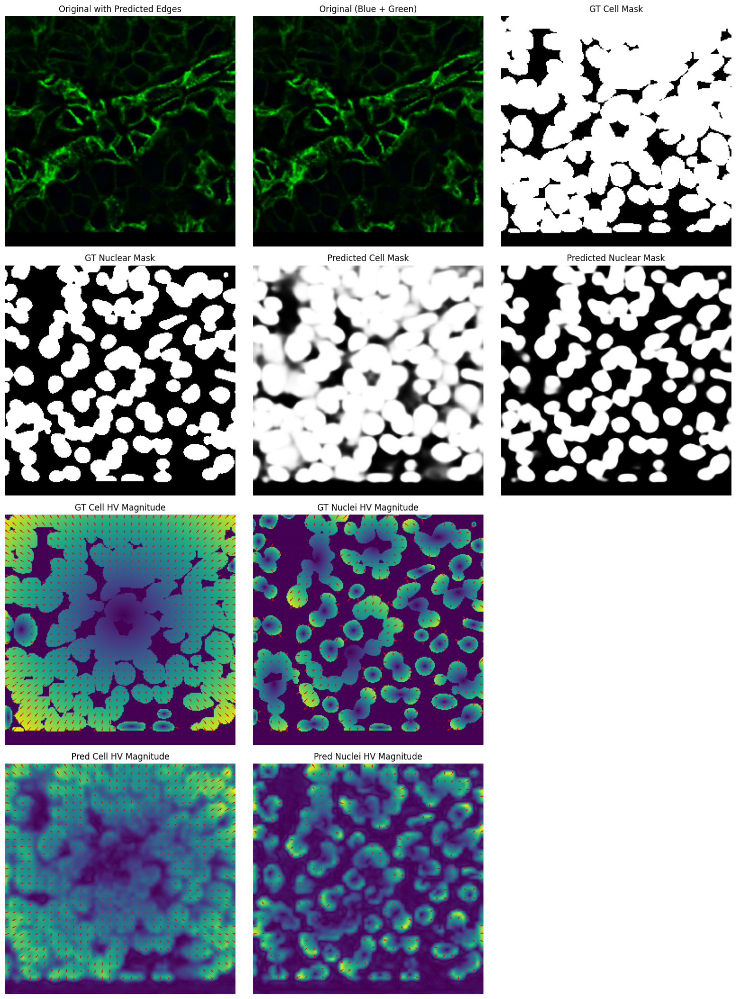

In [76]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def detect_edges_from_hv(hv_map, threshold=0.2):
    h_map = hv_map[0]
    v_map = hv_map[1]
    
    # Compute the magnitude of the HV vectors
    magnitude = np.sqrt(h_map**2 + v_map**2)
    
    # Compute the gradient of the HV field
    h_grad = np.gradient(h_map)
    v_grad = np.gradient(v_map)
    
    # Compute the curl of the HV field
    curl = h_grad[1] - v_grad[0]
    
    # Combine curl and magnitude to detect edges
    edges = (np.abs(curl) > threshold) & (magnitude > 0.1)
    
    # Apply some morphological operations to clean up the edges
    from scipy import ndimage
    edges = ndimage.binary_dilation(edges)
    edges = ndimage.binary_erosion(edges)
    
    return edges

def visualize_hv_map(hv_map, ax, title):
    magnitude = np.sqrt(hv_map[0]**2 + hv_map[1]**2)
    
    ax.imshow(magnitude, cmap='viridis')
    ax.set_title(title + ' Magnitude')
    ax.axis('off')
    
    # Downsample for clearer visualization
    step = 8
    Y, X = np.mgrid[step//2:magnitude.shape[0]:step, step//2:magnitude.shape[1]:step]
    U = hv_map[0][Y, X]
    V = hv_map[1][Y, X]
    
    ax.quiver(X, Y, U, V, color='r', angles='xy', scale_units='xy', scale=0.1)

def visualize_results(model, dataset, num_samples=3):
    model.eval()
    
    for _ in range(num_samples):
        # Get a random sample from the dataset
        idx = np.random.randint(len(dataset))
        image, cell_mask_true, nuclei_mask_true, cell_hv_true, nuclei_hv_true = dataset[idx]
        
        # Ensure image is on CPU and convert to numpy for visualization
        image = image.cpu().numpy()
        cell_mask_true = cell_mask_true.cpu().numpy().squeeze()
        nuclei_mask_true = nuclei_mask_true.cpu().numpy().squeeze()
        
        # Run inference
        with torch.no_grad():
            input_tensor = torch.unsqueeze(dataset[idx][0], 0).to(next(model.parameters()).device)
            cell_mask_pred, nuclei_mask_pred, cell_hv_pred, nuclei_hv_pred = model(input_tensor)
            cell_mask_pred = torch.sigmoid(cell_mask_pred).cpu().numpy().squeeze()
            nuclei_mask_pred = torch.sigmoid(nuclei_mask_pred).cpu().numpy().squeeze()
            cell_hv_pred = cell_hv_pred.cpu().numpy().squeeze()
            nuclei_hv_pred = nuclei_hv_pred.cpu().numpy().squeeze()
        
        # Check HV map shapes
        if cell_hv_pred.shape[0] != 2 or nuclei_hv_pred.shape[0] != 2:
            print(f"Unexpected HV map shape. Cell HV shape: {cell_hv_pred.shape}, Nuclei HV shape: {nuclei_hv_pred.shape}")
            continue
        
        # Create a figure with 4 rows and 3 columns
        fig, axes = plt.subplots(4, 3, figsize=(15, 20))
        
        # Combined original image
        combined = np.zeros((*image.shape[1:], 3))
        combined[..., 2] = image[0]  # Blue channel
        combined[..., 1] = image[1]  # Green channel
        combined = (combined - combined.min()) / (combined.max() - combined.min())
        
        # Detect edges using HV maps
        cell_edges = detect_edges_from_hv(cell_hv_pred)
        nuclei_edges = detect_edges_from_hv(nuclei_hv_pred)
        
        # Original image with predicted edges
        combined_with_edges = combined.copy()
        combined_with_edges[cell_edges] = [1, 0, 0]  # Red for cell edges
        combined_with_edges[nuclei_edges] = [1, 1, 0]  # Yellow for nuclei edges
        
        axes[0, 0].imshow(combined_with_edges)
        axes[0, 0].set_title('Original with Predicted Edges')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(combined)
        axes[0, 1].set_title('Original (Blue + Green)')
        axes[0, 1].axis('off')
        
        axes[0, 2].imshow(cell_mask_true, cmap='gray')
        axes[0, 2].set_title('GT Cell Mask')
        axes[0, 2].axis('off')
        
        axes[1, 0].imshow(nuclei_mask_true, cmap='gray')
        axes[1, 0].set_title('GT Nuclear Mask')
        axes[1, 0].axis('off')
        
        axes[1, 1].imshow(cell_mask_pred, cmap='gray')
        axes[1, 1].set_title('Predicted Cell Mask')
        axes[1, 1].axis('off')
        
        axes[1, 2].imshow(nuclei_mask_pred, cmap='gray')
        axes[1, 2].set_title('Predicted Nuclear Mask')
        axes[1, 2].axis('off')
        
        # Visualize HV maps
        visualize_hv_map(cell_hv_true, axes[2, 0], 'GT Cell HV')
        visualize_hv_map(nuclei_hv_true, axes[2, 1], 'GT Nuclei HV')
        axes[2, 2].axis('off')  # Empty subplot
        
        visualize_hv_map(cell_hv_pred, axes[3, 0], 'Pred Cell HV')
        visualize_hv_map(nuclei_hv_pred, axes[3, 1], 'Pred Nuclei HV')
        axes[3, 2].axis('off')  # Empty subplot
        
        plt.tight_layout()
        plt.show()

# Usage
visualize_results(model, test_dataset, num_samples=1)

Using device: cuda
Using the trained model


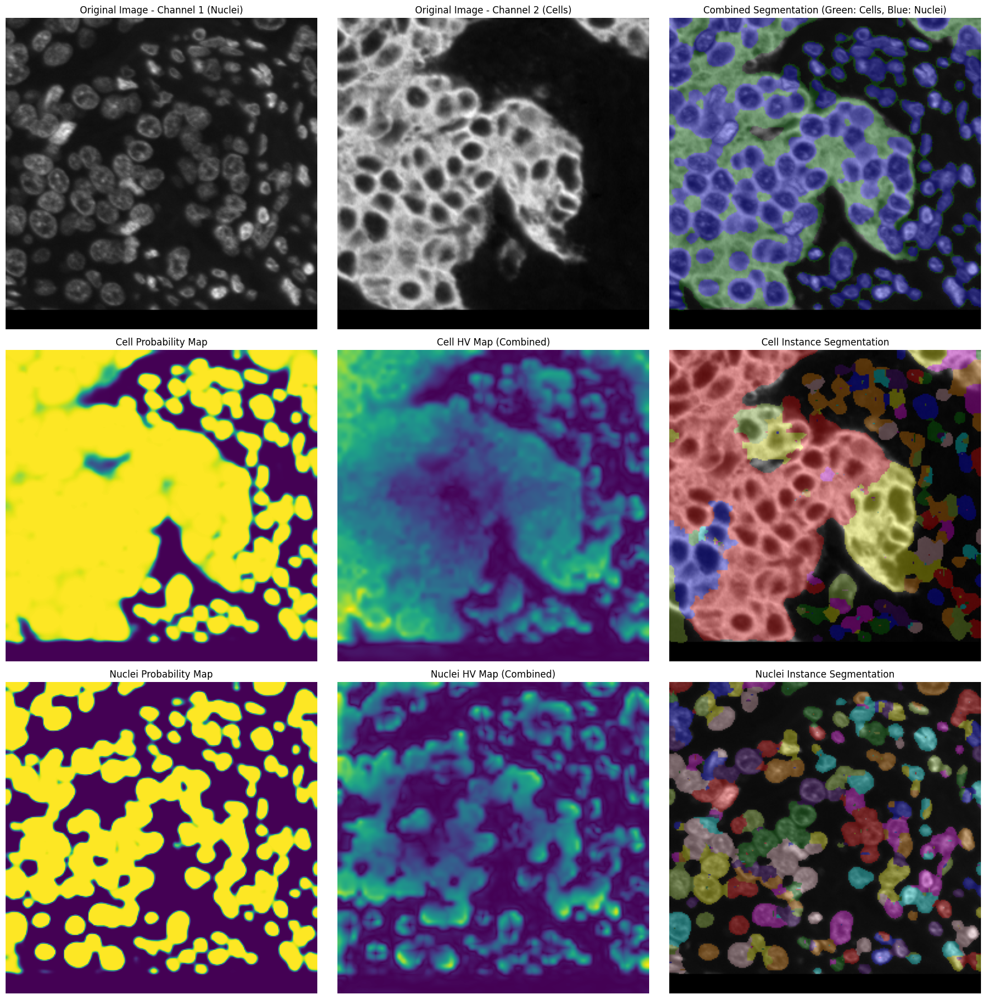

In [99]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.color import label2rgb
from skimage.exposure import rescale_intensity

def separate_instances(prob_map, hv_map, prob_thresh=0.5, hv_thresh=0.1):
    # Create binary mask from probability map
    mask = prob_map > prob_thresh
    
    # Compute gradients of HV maps
    grad_h = np.abs(hv_map[0, 1:, :] - hv_map[0, :-1, :])
    grad_v = np.abs(hv_map[1, :, 1:] - hv_map[1, :, :-1])
    
    # Pad gradients to match original size
    grad_h = np.pad(grad_h, ((1, 0), (0, 0)), mode='constant')
    grad_v = np.pad(grad_v, ((0, 0), (1, 0)), mode='constant')
    
    # Combine gradients
    grad_combined = np.maximum(grad_h, grad_v)
    
    # Find local maxima (instance centers)
    distance = ndi.distance_transform_edt(mask)
    coordinates = peak_local_max(distance, footprint=np.ones((3, 3)), labels=mask)
    local_maxi = np.zeros_like(mask, dtype=bool)
    local_maxi[tuple(coordinates.T)] = True
    
    # Create markers for watershed
    markers, _ = ndi.label(local_maxi)
    
    # Perform watershed
    segmentation = watershed(grad_combined, markers, mask=mask)
    
    return segmentation

def visualize_sample(model, image):
    device = next(model.parameters()).device
    image = image.to(device)
    with torch.no_grad():
        cell_seg_out, nuclei_seg_out, cell_hv_out, nuclei_hv_out = model(image.unsqueeze(0))
    
    cell_prob = torch.sigmoid(cell_seg_out).squeeze().cpu().numpy()
    cell_hv_map = cell_hv_out.squeeze().cpu().numpy()
    nuclei_prob = torch.sigmoid(nuclei_seg_out).squeeze().cpu().numpy()
    nuclei_hv_map = nuclei_hv_out.squeeze().cpu().numpy()
    
    # Separate instances using HV maps
    cell_segmentation = separate_instances(cell_prob, cell_hv_map)
    nuclei_segmentation = separate_instances(nuclei_prob, nuclei_hv_map)
    
    # Visualize
    fig, axs = plt.subplots(3, 3, figsize=(18, 18))
    
    # Original Image - Channel 1 (Nuclei)
    nuclei_channel = rescale_intensity(image[0].cpu().numpy(), out_range=(0, 1))
    axs[0, 0].imshow(nuclei_channel, cmap='gray')
    axs[0, 0].set_title('Original Image - Channel 1 (Nuclei)')
    axs[0, 0].axis('off')
    
    # Original Image - Channel 2 (Cells)
    cell_channel = rescale_intensity(image[1].cpu().numpy(), out_range=(0, 1))
    axs[0, 1].imshow(cell_channel, cmap='gray')
    axs[0, 1].set_title('Original Image - Channel 2 (Cells)')
    axs[0, 1].axis('off')
    
    # Combined Segmentation
    combined_seg = np.zeros_like(cell_segmentation)
    combined_seg[cell_prob > 0.5] = 1  # Cells
    combined_seg[nuclei_prob > 0.5] = 2  # Nuclei
    combined_image = label2rgb(combined_seg, image=np.max(image.cpu().numpy(), axis=0), bg_label=0, colors=['green', 'blue'])
    axs[0, 2].imshow(combined_image)
    axs[0, 2].set_title('Combined Segmentation (Green: Cells, Blue: Nuclei)')
    axs[0, 2].axis('off')
    
    # Cell Probability Map
    axs[1, 0].imshow(cell_prob, cmap='viridis')
    axs[1, 0].set_title('Cell Probability Map')
    axs[1, 0].axis('off')
    
    # Cell HV Map
    axs[1, 1].imshow(np.abs(cell_hv_map[0]) + np.abs(cell_hv_map[1]), cmap='viridis')
    axs[1, 1].set_title('Cell HV Map (Combined)')
    axs[1, 1].axis('off')
    
    # Cell Instance Segmentation
    axs[1, 2].imshow(label2rgb(cell_segmentation, image=cell_channel, bg_label=0))
    axs[1, 2].set_title('Cell Instance Segmentation')
    axs[1, 2].axis('off')
    
    # Nuclei Probability Map
    axs[2, 0].imshow(nuclei_prob, cmap='viridis')
    axs[2, 0].set_title('Nuclei Probability Map')
    axs[2, 0].axis('off')
    
    # Nuclei HV Map
    axs[2, 1].imshow(np.abs(nuclei_hv_map[0]) + np.abs(nuclei_hv_map[1]), cmap='viridis')
    axs[2, 1].set_title('Nuclei HV Map (Combined)')
    axs[2, 1].axis('off')
    
    # Nuclei Instance Segmentation
    axs[2, 2].imshow(label2rgb(nuclei_segmentation, image=nuclei_channel, bg_label=0))
    axs[2, 2].set_title('Nuclei Instance Segmentation')
    axs[2, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# (Rest of the code remains the same)

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Use your existing trained model
model = model.to(device)
model.eval()
print("Using the trained model")

# Get one sample from the test loader
images, _, _, _, _ = next(iter(test_loader))
image = images[6]

# Visualize the sample
visualize_sample(model, image)